In [3]:
import os
import sys
sys.path.append(os.path.join(os.path.dirname(os.getcwd()), 'src'))

from pathlib import Path
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
plt.rcParams["figure.figsize"] = (24,18)

In [4]:
data_path = os.path.join(os.path.dirname(os.getcwd()), 'data')

### Thresholding and background segmentationsegmentation

True


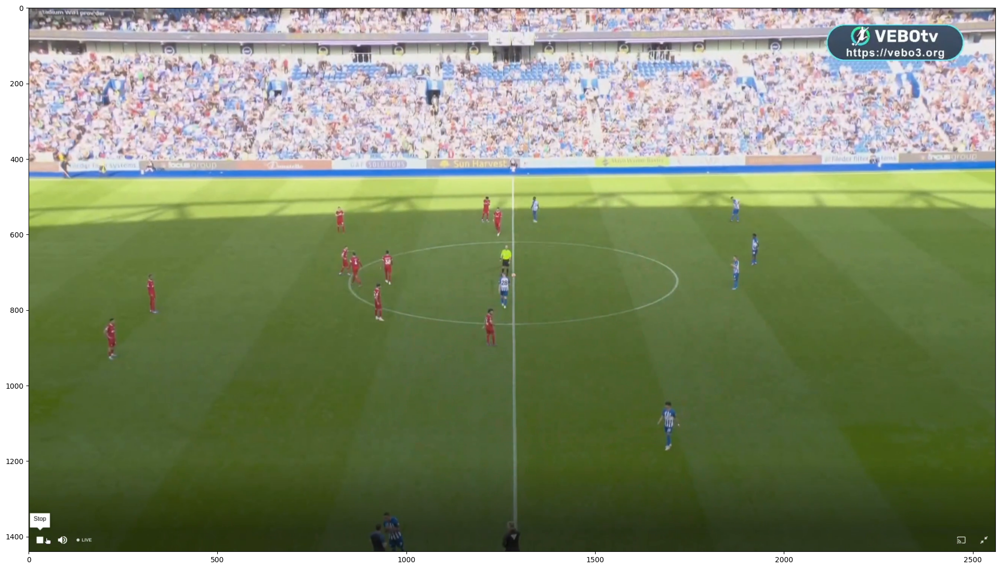

In [5]:
vid_name = 'Liv-BHA 2nd half'
images_path = os.path.join(data_path, 'images' + '/' + vid_name)
print(os.path.exists(images_path))
images_path
image_path = os.path.join(images_path, '000000000015.png')

rgb_image = cv2.imread(image_path, cv2.COLOR_BGR2RGB)

plt.figure()
plt.imshow(rgb_image[:,:,::-1])

#### Convert to HSV space

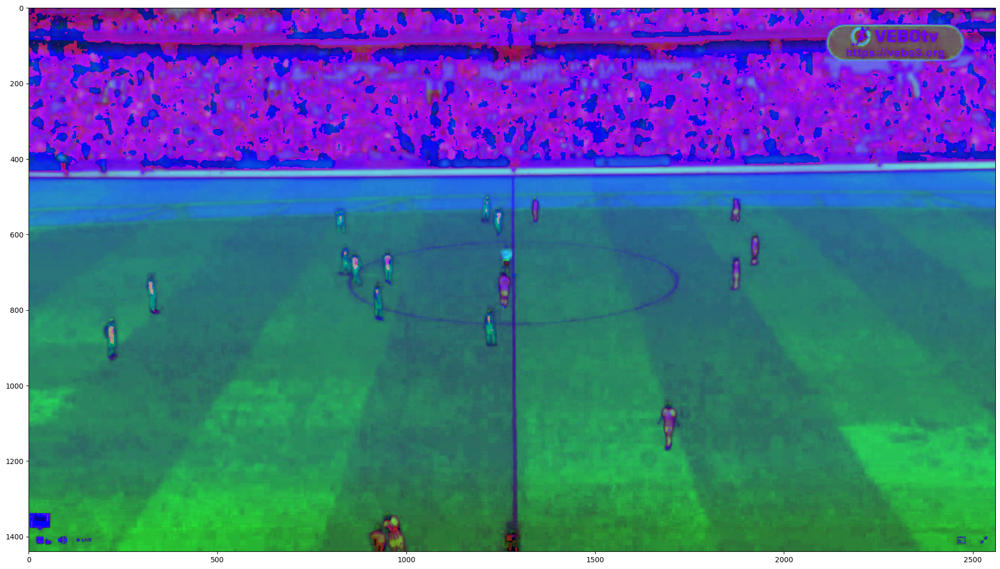

In [6]:
# Convert to HSV 
hsv_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2HSV)

plt.figure()
plt.imshow(hsv_image)

#### Threshold to take the green pixels

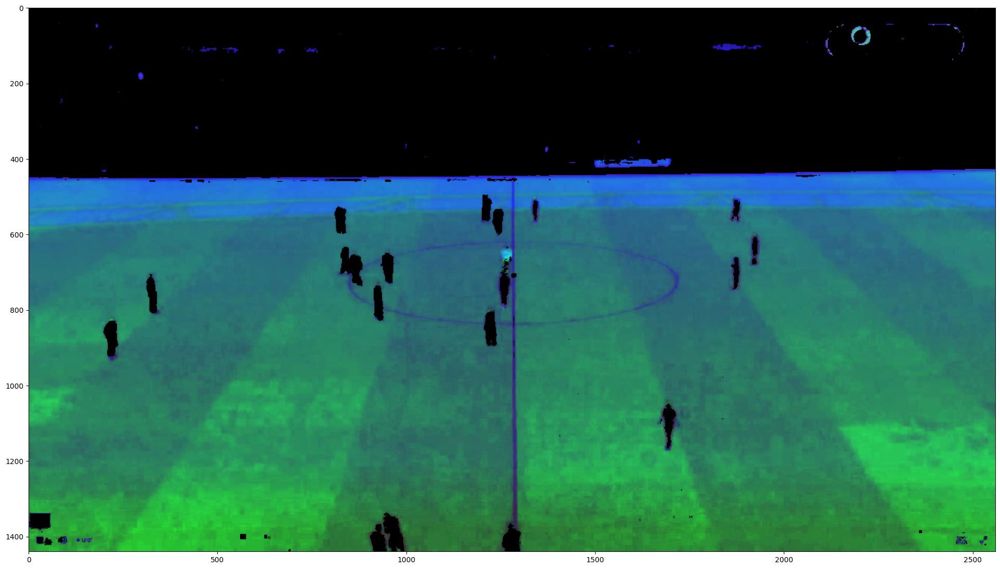

In [7]:
# Thresholding green pixel
lower_green = np.array([35, 20, 50])
upper_green = np.array([90, 255, 255])

mask_green = cv2.inRange(hsv_image, lower_green, upper_green)
result = cv2.bitwise_and(hsv_image, hsv_image, mask=mask_green)

plt.figure()
plt.imshow(result)

#### Contour detection

##### Contour detection on HSV image

[[   0  428]
 [2558  428]
 [2558 1438]
 [   0 1438]]


/tmp/ipykernel_590839/3081407359.py:13: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(cv2.boxPoints(cv2.minAreaRect(contours)))


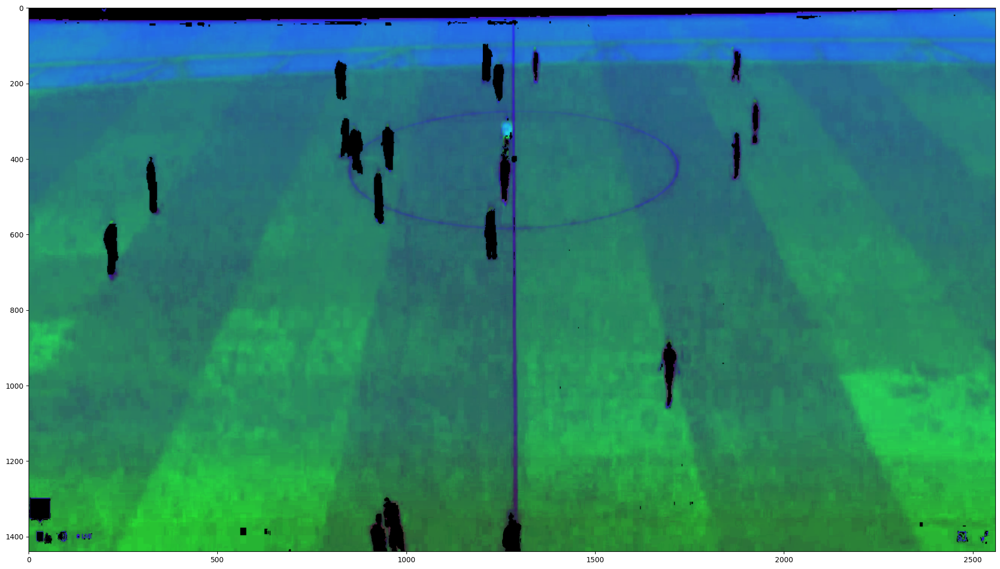

In [8]:
# Resize the image to only show the field
# Contour detection green
temp = cv2.cvtColor(result, cv2.COLOR_HSV2RGB)
h, w, _ = result.shape
_, green, _ = cv2.split(temp)

#ret, thresh = cv2.threshold(temp, 150, 255, cv2.THRESH_BINARY)

contours, hierarchy = cv2.findContours(image=green, mode=cv2.RETR_EXTERNAL,
                                      method=cv2.CHAIN_APPROX_NONE)

contours = max(contours, key=cv2.contourArea)
rect = np.int0(cv2.boxPoints(cv2.minAreaRect(contours)))
print(rect)
min_y, max_y = sorted(np.unique(rect[:, 1]))
min_x, max_x = sorted(np.unique(rect[:, 0]))
#cv2.polylines(img=temp, pts=[contours], isClosed=False, color=(255, 0, 0), thickness=5)
cv2.polylines(img=temp, pts=[rect],
                             isClosed=True, color=(255, 0, 0), thickness=5)

plt.imshow(temp[min_y:max_y, min_x:max_x])

# Crop the image
result = cv2.resize(result[min_y:max_y, min_x:max_x], (w, h))
rgb_image = cv2.resize(rgb_image[min_y:max_y, min_x:max_x], (w, h))
plt.imshow(result)

##### Contour detection on grayscale image

[[   0    0]
 [2559    0]
 [2559 1225]
 [   0 1225]]


/tmp/ipykernel_590839/4213711533.py:14: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(cv2.boxPoints(cv2.minAreaRect(contours)))


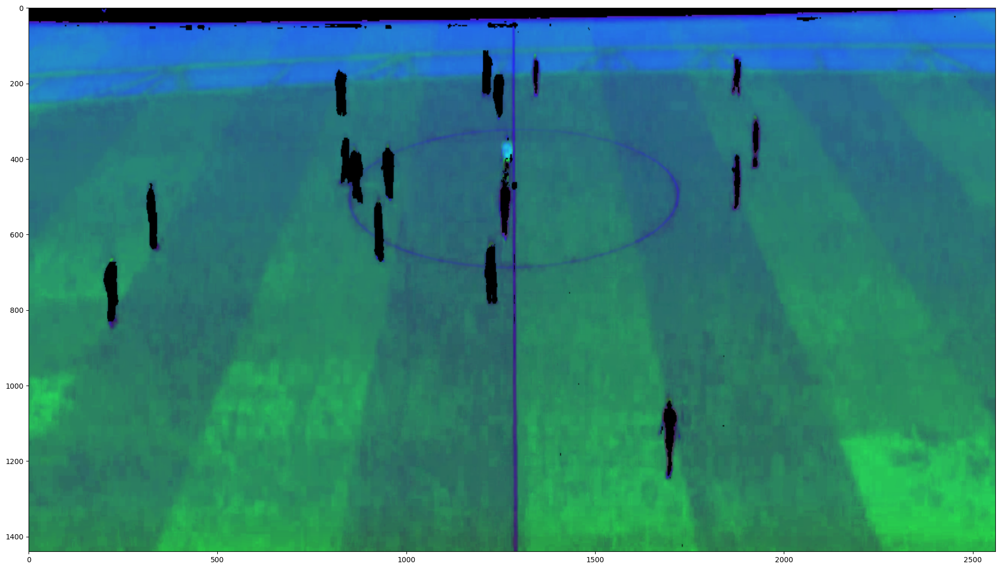

In [9]:
temp = cv2.cvtColor(result, cv2.COLOR_HSV2RGB)

# Contour detection whitewhite
gray = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2GRAY)
_, thresh = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY)

plt.figure()
plt.imshow(thresh)

contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_EXTERNAL,
                                      method=cv2.CHAIN_APPROX_NONE)

contours = max(contours, key=cv2.contourArea)
rect = np.int0(cv2.boxPoints(cv2.minAreaRect(contours)))
print(rect)

min_y, max_y = sorted(np.unique(rect[:, 1]))
min_x, max_x = sorted(np.unique(rect[:, 0]))

#cv2.polylines(img=temp, pts=[contours], isClosed=False, color=(255, 0, 0), thickness=5)
cv2.polylines(img=temp, pts=[rect],
                             isClosed=True, color=(255, 0, 0), thickness=5)

plt.imshow(temp)#[min_y:max_y, min_x:max_x])

# Crop the image
result = cv2.resize(result[min_y:max_y, min_x:max_x], (w, h))
rgb_image = cv2.resize(rgb_image[min_y:max_y, min_x:max_x], (w, h))
plt.imshow(result)

#### Edge detection

##### Canny Edge detection

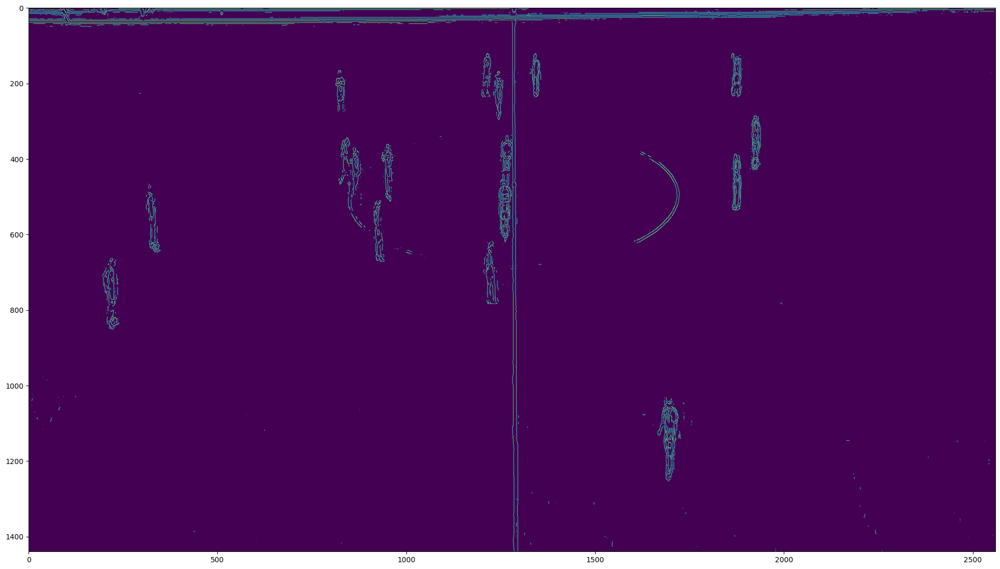

In [42]:
# Canny Edge detection
hsv_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2HSV)

edges = cv2.Canny(cv2.medianBlur(cv2.dilate(hsv_image, np.ones((3, 3), np.uint8), iterations=1),5) ,50,50, apertureSize=3)
edges = cv2.Canny(cv2.medianBlur(hsv_image,5) ,70,70, apertureSize=3)

plt.figure()
plt.imshow(edges)

##### Hough transform

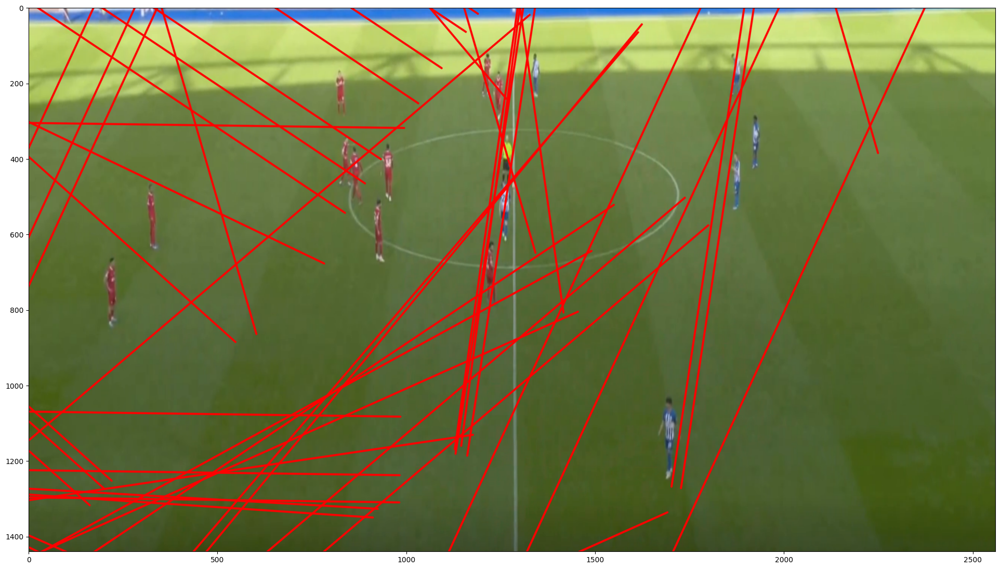

In [54]:
# Hough transform
lines = cv2.HoughLinesP(edges, 1, np.pi / 180, 150, None, 0, 0)
temp = rgb_image.copy()
all_pairs = []

 # Draw the lines
if lines is not None:
    for i in range(0, len(lines)):
        rho = lines[i][0][0]
        theta = lines[i][0][1]
        a = math.cos(theta)
        b = math.sin(theta)
        x0 = a * rho
        y0 = b * rho
        pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
        pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))

        cv2.line(temp, pt1, pt2, (0,0,255), 3, cv2.LINE_AA)
        all_pairs.append([pt1, pt2])


all_pairs = sorted(all_pairs, key = lambda pair: pair[0][1])
plt.figure()
plt.imshow(temp[:,:,::-1])

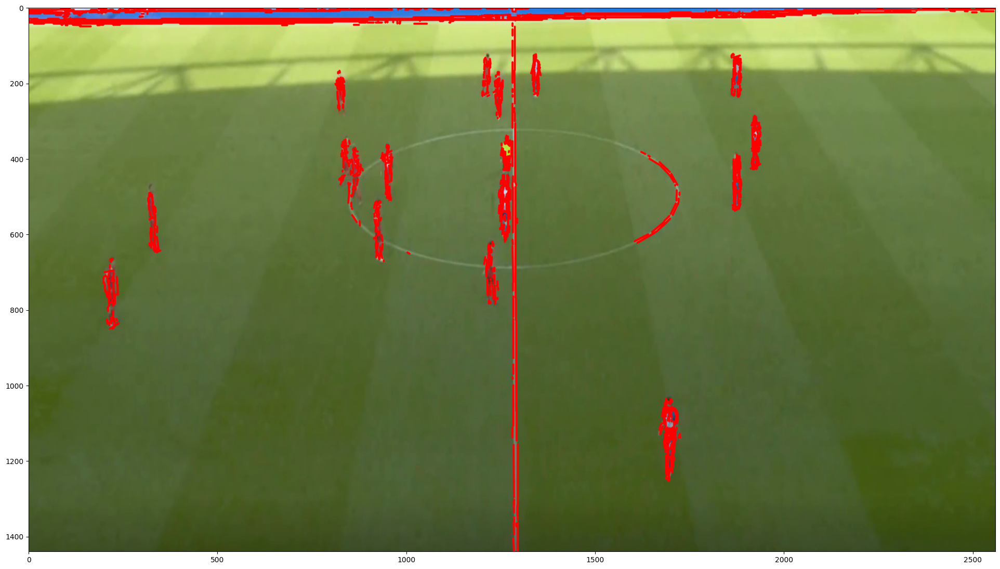

In [49]:
# Hough transform
lines = cv2.HoughLinesP(edges, 1, np.pi / 180, 20, 10, 3, 6)
temp = rgb_image.copy()
all_pairs = []
if lines is not None:
    for line in lines:
        cv2.line(temp, (line[0][0], line[0][1]), (line[0][2], line[0][3]), (0,0,255), 3, cv2.LINE_AA)
        all_pairs.append([(line[0][0], line[0][1]), (line[0][2], line[0][3])])
all_pairs = sorted(all_pairs, key = lambda pair: pair[0][1])
plt.figure()
plt.imshow(temp[:,:,::-1])

In [10]:
for point1, point2 in all_pairs:
    if np.absolute(point1[1] - point2[1]) <= 2 and 700 < point1[1] < 800:
        print(point1, point2)

(1369, 701) (1370, 700)
(816, 701) (816, 702)
(1039, 701) (1039, 701)
(1377, 701) (1379, 701)
(1061, 701) (1061, 701)
(796, 701) (796, 701)
(1802, 701) (1802, 703)
(1058, 701) (1059, 702)
(1045, 701) (1045, 699)
(1053, 701) (1053, 701)
(1545, 702) (1546, 702)
(461, 702) (461, 700)
(1039, 702) (1039, 702)
(1377, 702) (1377, 702)
(796, 702) (796, 702)
(457, 702) (458, 702)
(1137, 703) (1137, 703)
(815, 703) (815, 703)
(1140, 703) (1140, 704)
(1039, 703) (1039, 703)
(1135, 703) (1135, 703)
(1052, 703) (1053, 702)
(1055, 703) (1055, 703)
(1544, 703) (1544, 703)
(1044, 704) (1044, 705)
(1060, 704) (1061, 703)
(812, 704) (812, 703)
(1397, 704) (1397, 704)
(1390, 704) (1390, 703)
(1550, 704) (1550, 704)
(1369, 704) (1369, 702)
(1061, 704) (1061, 704)
(1041, 704) (1043, 704)
(1048, 704) (1048, 704)
(1052, 704) (1053, 703)
(1538, 705) (1538, 705)
(811, 705) (812, 706)
(459, 705) (459, 703)
(1801, 705) (1801, 705)
(1541, 705) (1541, 705)
(815, 705) (815, 705)
(1049, 705) (1052, 705)
(468, 705) (